In [ ]:
import pandas as pd
import numpy as np


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip "/content/drive/MyDrive/ARABIC OCR FIELDS/arabic_cards.zip"

Archive:  /content/drive/MyDrive/ARABIC OCR FIELDS/arabic_cards.zip
   creating: arabic_cards/
  inflating: arabic_cards/c.jpg      
  inflating: arabic_cards/c3.jpg     
  inflating: arabic_cards/eg1.jpeg   
  inflating: arabic_cards/Egypt_RC_2.jpeg  
  inflating: arabic_cards/IMG-20211124-WA0030.jpg  
  inflating: arabic_cards/IMG-20211215-WA0002.jpg  
  inflating: arabic_cards/IMG-20211215-WA0004 (1).jpg  
  inflating: arabic_cards/img2.png   
  inflating: arabic_cards/img4.png   
  inflating: arabic_cards/via_project_22Jan2022_11h20m.json  
  inflating: arabic_cards/via_regiondata_22jan.json.json  
  inflating: arabic_cards/WhatsApp Image 2021-10-24 at 15.09.jpg  


In [ ]:
import json
def loadJsonData(filename):
	# Opening JSON file
	f = open(filename)
	# returns JSON object as
	# a dictionary
	data = json.load(f)
	# Closing file	
	f.close()
	return data

In [ ]:
import os
baseDict = loadJsonData("/content/arabic_cards/via_regiondata_22jan.json.json")
imgLoc = list(baseDict.keys())
# baseDict["Egypt_RC_2.jpeg131637"]["filename"]
for i in imgLoc:
  print(os.path.join(os.getcwd(),"arabic_cards",baseDict[i]["filename"]))

/content/arabic_cards/c.jpg
/content/arabic_cards/c3.jpg
/content/arabic_cards/eg1.jpeg
/content/arabic_cards/Egypt_RC_2.jpeg
/content/arabic_cards/img2.png
/content/arabic_cards/img4.png
/content/arabic_cards/IMG-20211124-WA0030.jpg
/content/arabic_cards/IMG-20211215-WA0002.jpg
/content/arabic_cards/IMG-20211215-WA0004 (1).jpg
/content/arabic_cards/WhatsApp Image 2021-10-24 at 15.09.jpg


In [ ]:
baseDict

label :  1


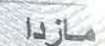

label :  2


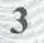

label :  3


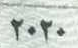

label :  4


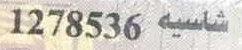

label :  5


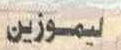

label :  6


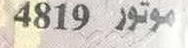

label :  7


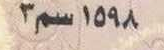

label :  8


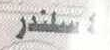

label :  9


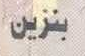

label :  10


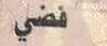

label :  11


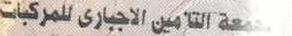

label :  12


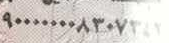

label :  13


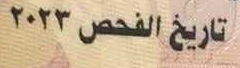

label :  14


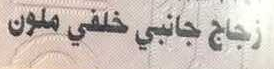

label :  15


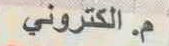

label :  16


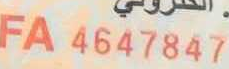

label :  17


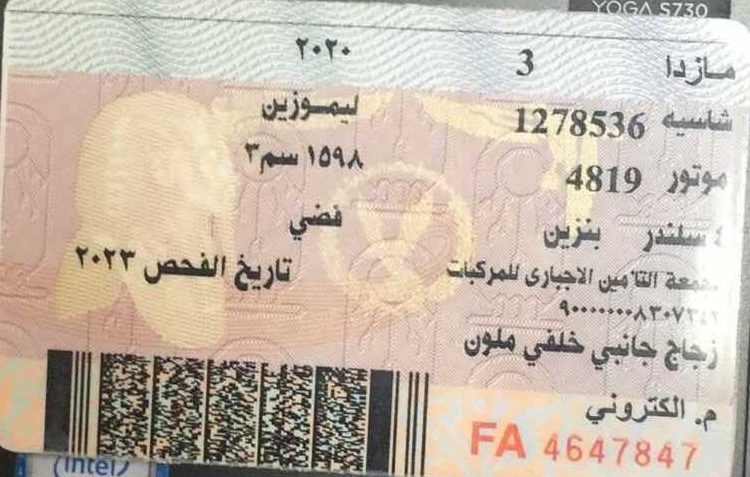

label :  1


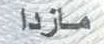

label :  2


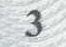

label :  3


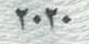

label :  4


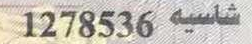

label :  5


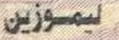

label :  6


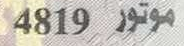

label :  7


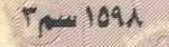

label :  8


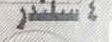

label :  9


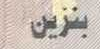

label :  10


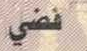

label :  11


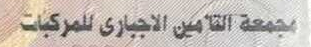

label :  12


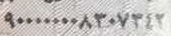

label :  13


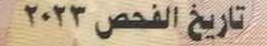

label :  14


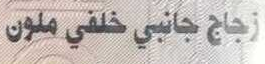

label :  15


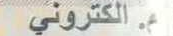

label :  16


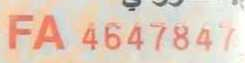

label :  17


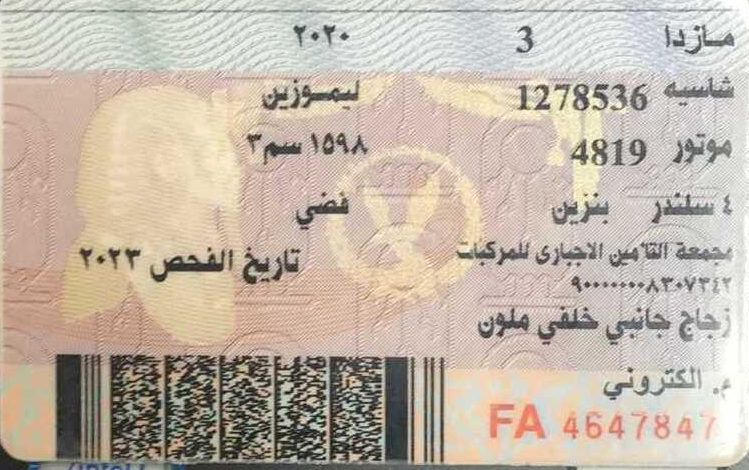

label :  1


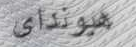

label :  2


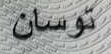

label :  3


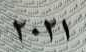

label :  4


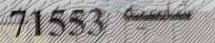

label :  5


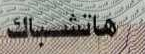

label :  6


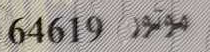

label :  7


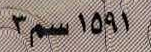

label :  8


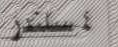

label :  9


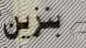

label :  10


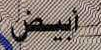

label :  11


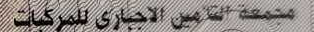

label :  12


label :  13


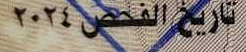

label :  14


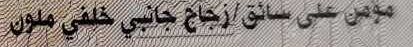

label :  15


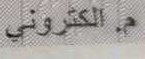

label :  16


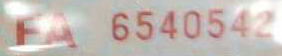

label :  17


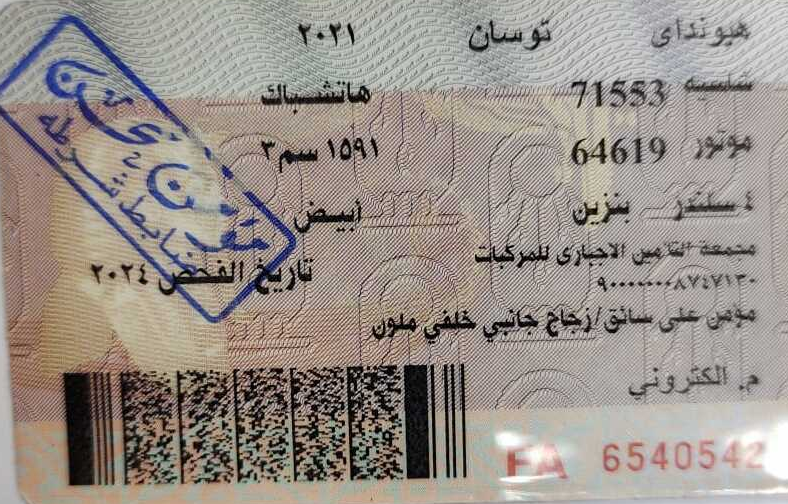

label :  1


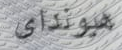

label :  2


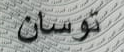

label :  3


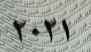

label :  4


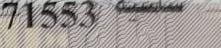

label :  5


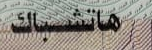

label :  6


label :  7


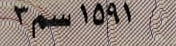

label :  8


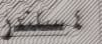

label :  9


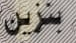

label :  10


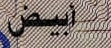

label :  11


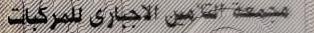

label :  12


label :  13


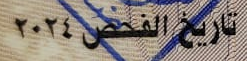

label :  14


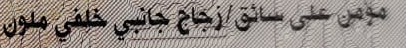

label :  15


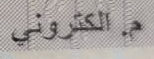

label :  16


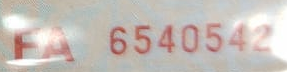

label :  17


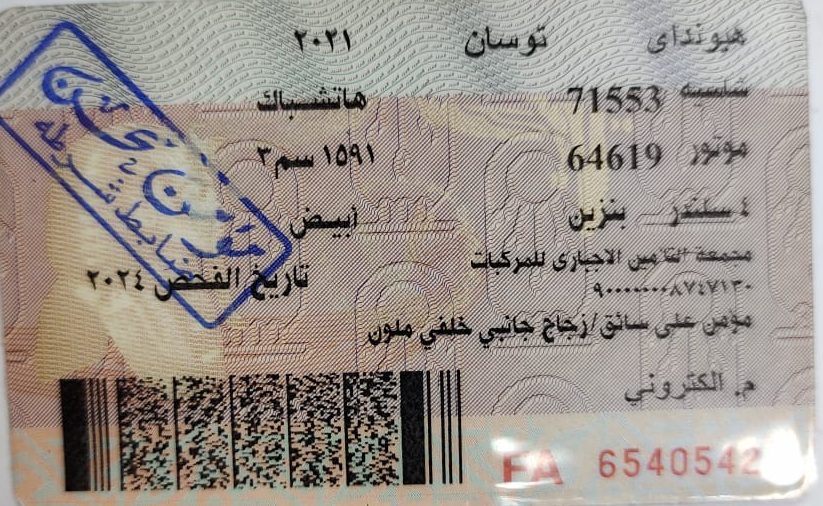

label :  1


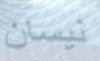

label :  2


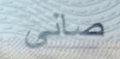

label :  3


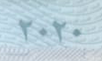

label :  4


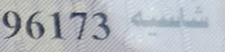

label :  5


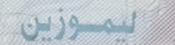

label :  6


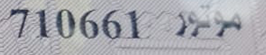

label :  7


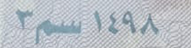

label :  8


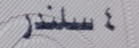

label :  9


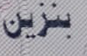

label :  10


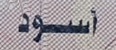

label :  11


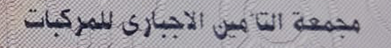

label :  12


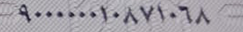

label :  13


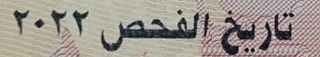

label :  14


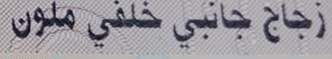

label :  15


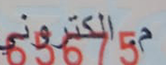

label :  16


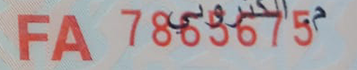

label :  17


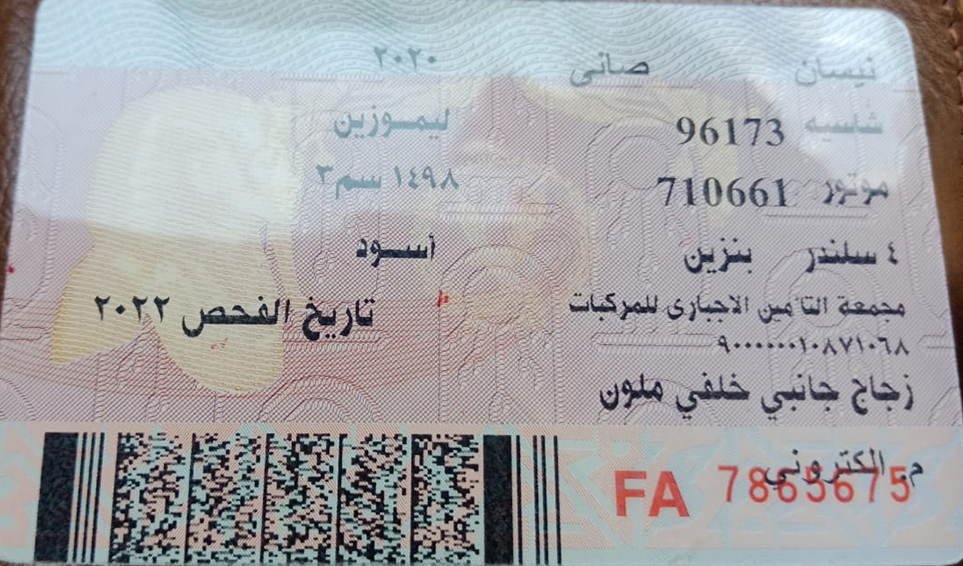

label :  1


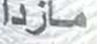

label :  2


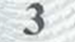

label :  3


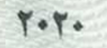

label :  4


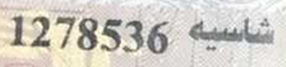

label :  5


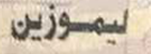

label :  6


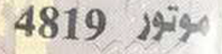

label :  7


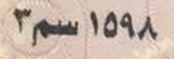

label :  8


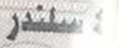

label :  9


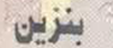

label :  10


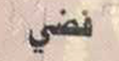

label :  11


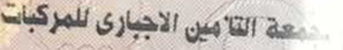

label :  12


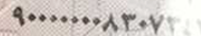

label :  13


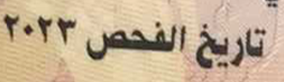

label :  14


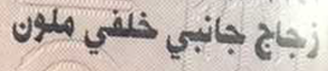

label :  15


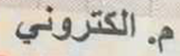

label :  16


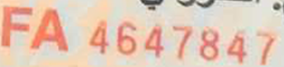

label :  17


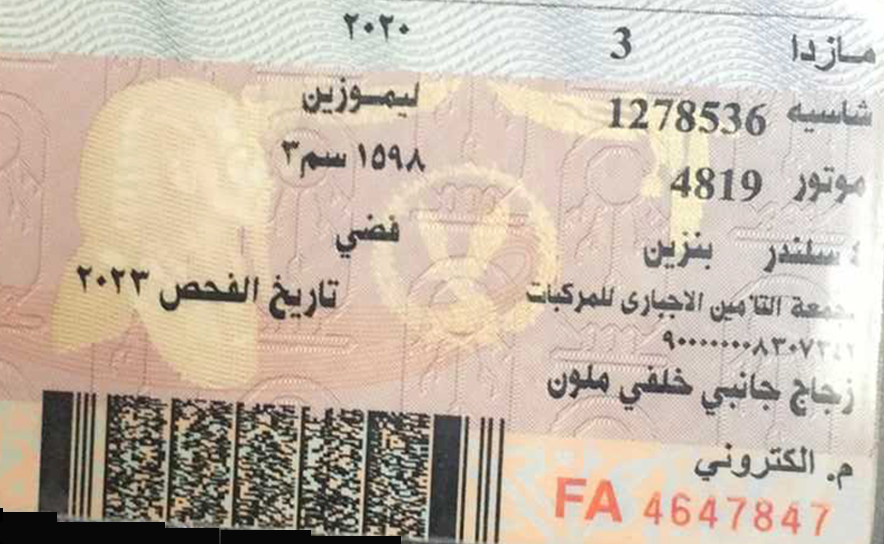

label :  1


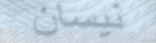

label :  2


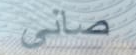

label :  3


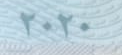

label :  4


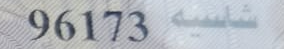

label :  5


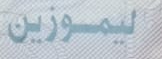

label :  6


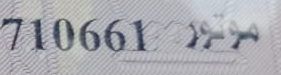

label :  7


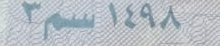

label :  8


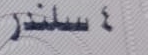

label :  9


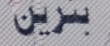

label :  10


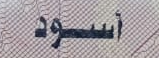

label :  11


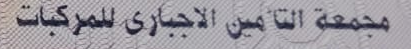

label :  12


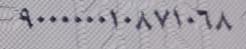

label :  13


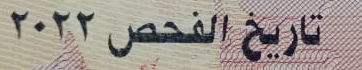

label :  14


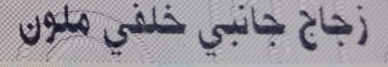

label :  15


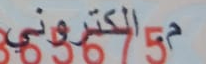

label :  16


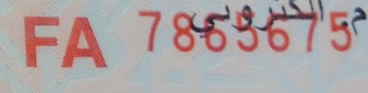

label :  17


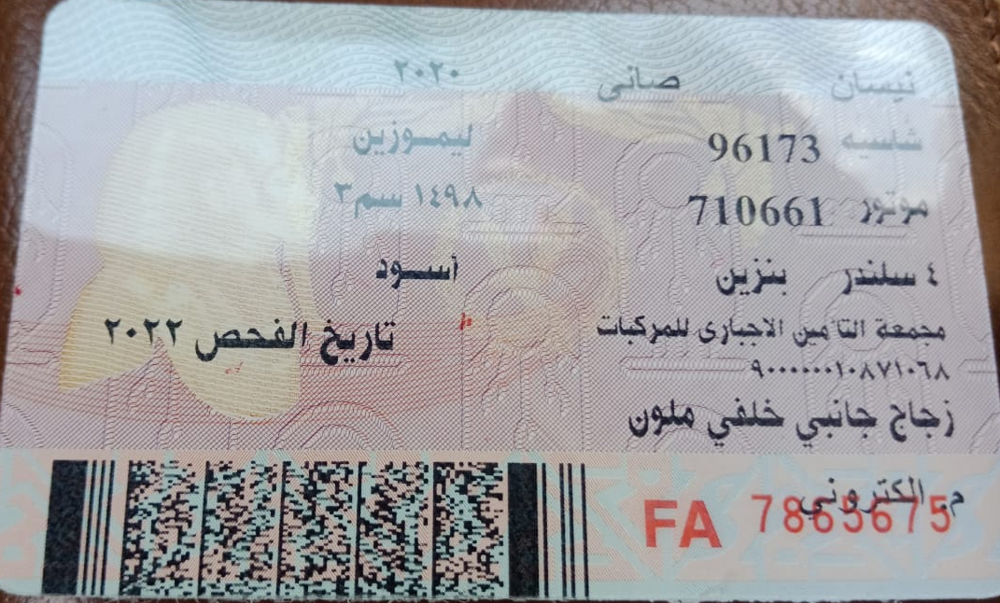

label :  1


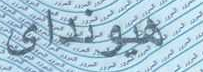

label :  2


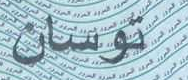

label :  3


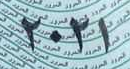

label :  4


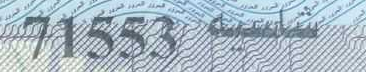

label :  5


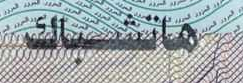

label :  6


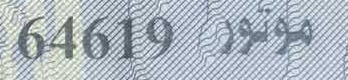

label :  7


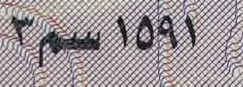

label :  8


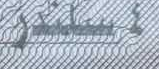

label :  9


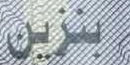

label :  10


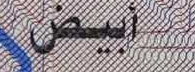

label :  11


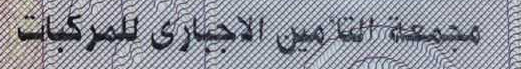

label :  12


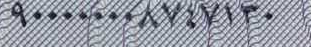

label :  13


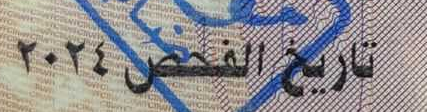

label :  14


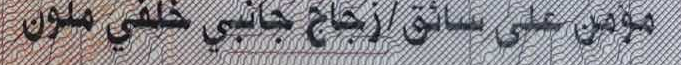

label :  15


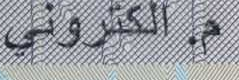

label :  16


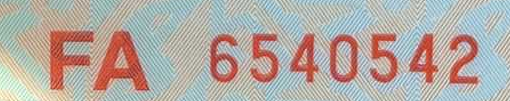

label :  17


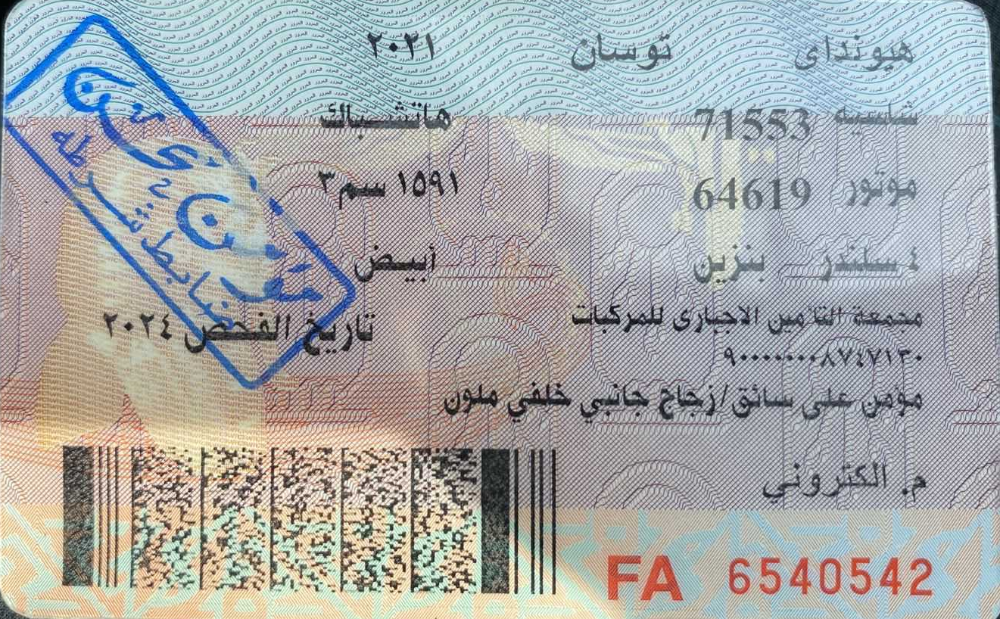

label :  1


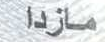

label :  2


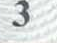

label :  3


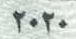

label :  4


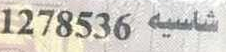

label :  5


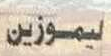

label :  6


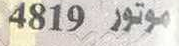

label :  7


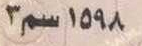

label :  8


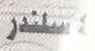

label :  9


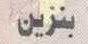

label :  10


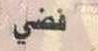

label :  11


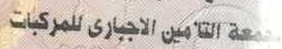

label :  12


label :  13


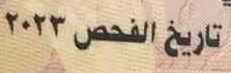

label :  14


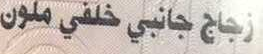

label :  15


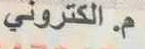

label :  16


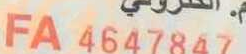

label :  17


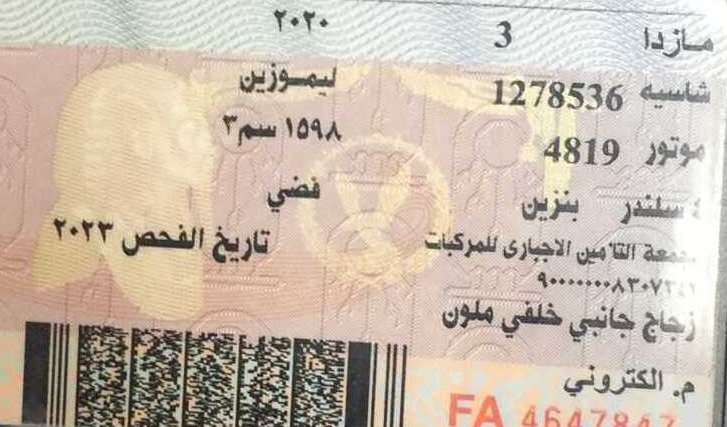

label :  1


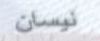

label :  2


label :  3


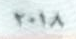

label :  4


label :  5


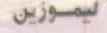

label :  6


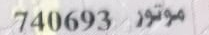

label :  4


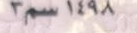

label :  8


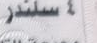

label :  9


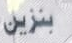

label :  10


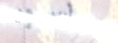

label :  11


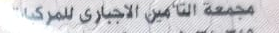

label :  12


label :  13


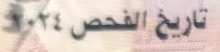

label :  14


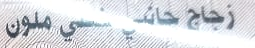

label :  15


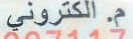

label :  16


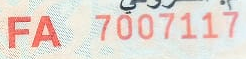

label :  17


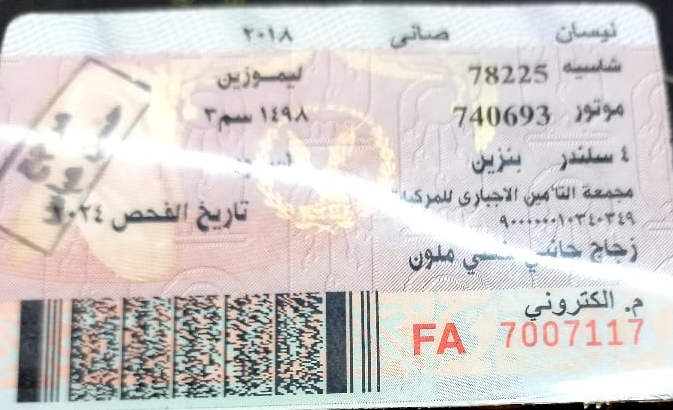

,label,x1,y1,x2,y2,id
16,17,26,4,776,481,c.jpg46967
33,17,23,11,772,481,c3.jpg53306
50,17,6,12,794,516,eg1.jpeg77447
67,17,28,293,851,799,Egypt_RC_2.jpeg131637
84,17,32,32,995,598,img2.png1009103
101,17,23,6,907,550,img4.png689462
118,17,142,23,1213,669,IMG-20211124-WA0030.jpg145269
135,17,181,72,1502,890,IMG-20211215-WA0002.jpg262188
152,17,14,8,741,435,IMG-20211215-WA0004 (1).jpg41290
169,17,9,231,682,641,WhatsApp Image 2021-10-24 at 15.09.jpg120179


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import pandas as pd
imgLoc = list(baseDict.keys())
lod = []
for itr in imgLoc:
  im = cv2.imread(os.path.join(os.getcwd(),"arabic_cards",baseDict[itr]["filename"]))
  list(baseDict.keys())
  img_attrib= baseDict[itr]['regions']
  for i in range(len(img_attrib)):
    label_json = img_attrib[i]['region_attributes']
    reg_json = img_attrib[i]['shape_attributes']
    lrx =reg_json['x']
    lry = reg_json['y']
    h = reg_json['height']
    w = reg_json['width']
    x2 = lrx+w
    y2 = lry+h
    ind_dict = {"label":label_json['name'],"x1":lrx,"y1":lry,"x2":x2,"y2":y2,"id":itr}
    lod.append(ind_dict)
    print("label : ",label_json['name'])
    cv2_imshow(im[lry:lry+h,lrx:lrx+w])
df = pd.DataFrame(lod)
df_totalCardSize = df.loc[df["label"]=="17"]
df_totalCardSize
# df.groupby("id")



## Please check the following error when possible
### Edit the following functin join is not correct . It should be **merge** not **join** 

In [ ]:
df_totalCardSize = df.loc[df["label"]=="17"]
# df_totalCardSize['id']=df_totalCardSize['id'].astype(str)
# df['id']=df['id'].astype(str)
df.merge(df_totalCardSize,on='id')

,label_x,x1_x,y1_x,x2_x,y2_x,id,label_y,x1_y,y1_y,x2_y,y2_y
0,1,666,42,771,88,c.jpg46967,17,26,4,776,481
1,2,532,46,576,89,c.jpg46967,17,26,4,776,481
2,3,311,23,389,71,c.jpg46967,17,26,4,776,481
3,4,530,103,772,153,c.jpg46967,17,26,4,776,481
4,5,281,82,402,132,c.jpg46967,17,26,4,776,481
...,...,...,...,...,...,...,...,...,...,...,...
165,13,50,423,270,475,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641
166,14,412,464,667,512,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641
167,15,527,521,660,560,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641
168,16,414,538,660,597,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641


### The following is correct implementation .

In [ ]:
df_totalCardSize = df.loc[df["label"]=="17"]
# df_totalCardSize['id']=df_totalCardSize['id'].astype(str)
# df['id']=df['id'].astype(str)
updated_df= df.merge(df_totalCardSize,on='id')


# display(df_totalCardSize.info())
# display(df.info())

Below is once again wrong implementation

In [ ]:
# updated_df["transformed_x"]=updated_df.apply(lambda x : x['x1_x'])

The following is correct . Note that the following process is for standardization of values .
### Standardization : 

In [ ]:
updated_df["transformed_x1"]=updated_df.apply(lambda x : (x['x2_y']-x['x1_x'])/(x['x2_y']-x['x1_y']),axis=1)
updated_df["transformed_y1"]=updated_df.apply(lambda x : (x['y2_y']-x['y1_x'])/(x['y2_y']-x['y1_y']),axis=1)
updated_df["transformed_x2"]=updated_df.apply(lambda x : (x['x2_y']-x['x2_x'])/(x['x2_y']-x['x1_y']),axis=1)
updated_df["transformed_y2"]=updated_df.apply(lambda x : (x['y2_y']-x['y2_x'])/(x['y2_y']-x['y1_y']),axis=1)
display(updated_df)

,label_x,x1_x,y1_x,x2_x,y2_x,id,label_y,x1_y,y1_y,x2_y,y2_y,transformed_x1,transformed_y1,transformed_x2,transformed_y2
0,1,666,42,771,88,c.jpg46967,17,26,4,776,481,0.146667,0.920335,0.006667,0.823899
1,2,532,46,576,89,c.jpg46967,17,26,4,776,481,0.325333,0.911950,0.266667,0.821803
2,3,311,23,389,71,c.jpg46967,17,26,4,776,481,0.620000,0.960168,0.516000,0.859539
3,4,530,103,772,153,c.jpg46967,17,26,4,776,481,0.328000,0.792453,0.005333,0.687631
4,5,281,82,402,132,c.jpg46967,17,26,4,776,481,0.660000,0.836478,0.498667,0.731656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,13,50,423,270,475,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.939079,0.531707,0.612184,0.404878
166,14,412,464,667,512,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.401189,0.431707,0.022288,0.314634
167,15,527,521,660,560,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.230312,0.292683,0.032689,0.197561
168,16,414,538,660,597,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.398217,0.251220,0.032689,0.107317


In the following example, we will try for label 1 first . We will create a new column specifically for label 1 and keep that field as binary(For logistic regression)

In [ ]:
# updated_df['']

In [ ]:
updated_df['label_1']= updated_df.apply(lambda x : 1 if x['label_x']=='1' else 0,axis=1)

In [ ]:
#To check if the changes have been reflected properly , double check
updated_df.loc[updated_df['label_1']==1]

,label_x,x1_x,y1_x,x2_x,y2_x,id,label_y,x1_y,y1_y,x2_y,y2_y,transformed_x1,transformed_y1,transformed_x2,transformed_y2,label_1
0,1,666,42,771,88,c.jpg46967,17,26,4,776,481,0.146667,0.920335,0.006667,0.823899,1
17,1,667,28,771,72,c3.jpg53306,17,23,11,772,481,0.140187,0.963830,0.001335,0.870213,1
34,1,644,22,780,69,eg1.jpeg77447,17,6,12,794,516,0.190355,0.980159,0.017766,0.886905,1
51,1,660,308,782,358,Egypt_RC_2.jpeg131637,17,28,293,851,799,0.232078,0.970356,0.083840,0.871542,1
68,1,822,70,922,131,img2.png1009103,17,32,32,995,598,0.179647,0.932862,0.075805,0.825088,1
85,1,812,42,912,86,img4.png689462,17,23,6,907,550,0.107466,0.933824,-0.005656,0.852941,1
102,1,999,96,1155,139,IMG-20211124-WA0030.jpg145269,17,142,23,1213,669,0.199813,0.886997,0.054155,0.820433,1
119,1,1224,109,1427,181,IMG-20211215-WA0002.jpg262188,17,181,72,1502,890,0.210447,0.954768,0.056775,0.866748,1
136,1,631,29,736,71,IMG-20211215-WA0004 (1).jpg41290,17,14,8,741,435,0.151307,0.950820,0.006878,0.852459,1
153,1,549,242,649,283,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.197623,0.973171,0.049034,0.873171,1


Great , its working .So now lets move onto the logistic Regression 

### Conversion to numbers and float for GLM model 
Note : In the following execution we HAVE to make sure that all attributes are numbers **and not strings or objects** . GLM doesent work that way!

In [ ]:
X_train = updated_df[['transformed_x1','transformed_y1','transformed_x2','transformed_y2']].astype(float)
Y_train = updated_df['label_x'].astype(int)

In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [ ]:
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train)
logm2 = sm.GLM(Y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: invalid value encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))


PerfectSeparationError: ignored

As we can see , logistic regression is not ideal , since the variables are not linearly dependent . We cannot say that as Transformed_x increases, the probabillity of that variable being label type 1 is high. Our logic is more boundary specific and not proportional specific.

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from matplotlib import pyplot as plt
def create_model(my_learning_rate):
  """Create and compile a deep neural net."""
  
  # All models in this course are sequential.
  model = tf.keras.models.Sequential()

  # The features are stored in a two-dimensional 28X28 array. 
  # Flatten that two-dimensional array into a a one-dimensional 
  # 784-element array.
  # model.add(tf.keras.layers.Flatten(input_shape=(28, 28)))

  model.add(tf.keras.Input(shape=(4,)))
  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=16, activation='relu'))
  # model.add(tf.keras.layers.Dense(units=16, activation='relu'))
  # model.add(tf.keras.layers.Dense(units=16, activation='relu'))
  # Define a dropout regularization layer. 
  # model.add(tf.keras.layers.Dropout(rate=0.2))

  # Define the output layer. The units parameter is set to 10 because
  # the model must choose among 10 possible output values (representing
  # the digits from 0 to 9, inclusive).
  #
  # Don't change this layer.
  model.add(tf.keras.layers.Dense(units=17, activation='softmax'))     
                           
  # Construct the layers into a model that TensorFlow can execute.  
  # Notice that the loss function for multi-class classification
  # is different than the loss function for binary classification.  
  model.compile(optimizer=tf.keras.optimizers.Adam(lr=my_learning_rate),
                loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])
  
  return model    


def train_model(model, train_features, train_label, epochs,
                batch_size=None, validation_split=0.1):
  """Train the model by feeding it data."""

  history = model.fit(x=train_features, y=train_label, batch_size=batch_size,
                      epochs=epochs, shuffle=True, 
                      validation_split=validation_split)
 
  # To track the progression of training, gather a snapshot
  # of the model's metrics at each epoch. 
  epochs = history.epoch
  hist = pd.DataFrame(history.history)

  return epochs, hist 
def plot_curve(epochs, hist, list_of_metrics):
  """Plot a curve of one or more classification metrics vs. epoch."""  
  # list_of_metrics should be one of the names shown in:
  # https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#define_the_model_and_metrics  

  plt.figure()
  plt.xlabel("Epoch")
  plt.ylabel("Value")

  for m in list_of_metrics:
    x = hist[m]
    plt.plot(epochs[1:], x[1:], label=m)

  plt.legend()

print("Loaded the plot_curve function.")

Loaded the plot_curve function.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_train, Y_train, train_size=0.7, test_size=0.3, random_state=45)

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.003
epochs = 100
batch_size = 2
validation_split = 0.2

# Establish the model's topography.
my_model = create_model(learning_rate)

# Train the model on the normalized training set.
epochs, hist = train_model(my_model, X_train, y_train, 
                           epochs, batch_size, validation_split)

# Plot a graph of the metric vs. epochs.
list_of_metrics_to_plot = ['accuracy']
plot_curve(epochs, hist, list_of_metrics_to_plot)

# Evaluate against the test set.
print("\n Evaluate the new model against the test set:")
my_model.evaluate(x=X_test, y=y_test, batch_size=batch_size)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100


InvalidArgumentError: ignored

In [ ]:
my_model

TypeError: ignored

In [ ]:
def binaryOutput(pred_results,batch_size=2):
  for i in range(batch_size):
    if(pred_results[i][0]<pred_results[i][1]):
      print("Belongs to category 1")
    else:
      print("Doesent belong to category 1!")

In [ ]:
# print()
# print( my_model.predict([[0.328000,0.792453,0.005333,0.687631],[0.230312,0.292683,0.032689,0.197561]]))
binaryOutput(my_model.predict([[0.146667,0.920335,0.006667,0.823899],[0.325333,0.911950,0.266667,0.821803]]))
binaryOutput(my_model.predict([[0.328000,0.792453,0.005333,0.687631],[0.199813,0.886997,0.054155,0.820433]]))

Belongs to category 1
Doesent belong to category 1!
Doesent belong to category 1!
Belongs to category 1



## In the following error while trying to replace the data with multicaetegoy , we notice a strange error .This is happening because 17 is outside the range of permissible values .

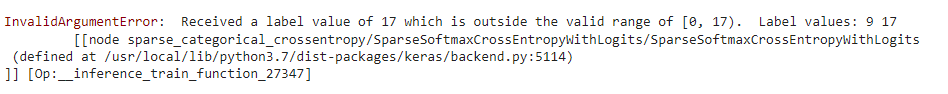

In order to fix this we will shift the labels , from (1 ,17) to (0,16) and then try again

In [ ]:
multi_df = updated_df.copy()
multi_df['label_x'] = multi_df['label_x'].astype('int')-1
display(multi_df)

,label_x,x1_x,y1_x,x2_x,y2_x,id,label_y,x1_y,y1_y,x2_y,y2_y,transformed_x1,transformed_y1,transformed_x2,transformed_y2,label_1
0,0,666,42,771,88,c.jpg46967,17,26,4,776,481,0.146667,0.920335,0.006667,0.823899,1
1,1,532,46,576,89,c.jpg46967,17,26,4,776,481,0.325333,0.911950,0.266667,0.821803,0
2,2,311,23,389,71,c.jpg46967,17,26,4,776,481,0.620000,0.960168,0.516000,0.859539,0
3,3,530,103,772,153,c.jpg46967,17,26,4,776,481,0.328000,0.792453,0.005333,0.687631,0
4,4,281,82,402,132,c.jpg46967,17,26,4,776,481,0.660000,0.836478,0.498667,0.731656,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,12,50,423,270,475,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.939079,0.531707,0.612184,0.404878,0
166,13,412,464,667,512,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.401189,0.431707,0.022288,0.314634,0
167,14,527,521,660,560,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.230312,0.292683,0.032689,0.197561,0
168,15,414,538,660,597,WhatsApp Image 2021-10-24 at 15.09.jpg120179,17,9,231,682,641,0.398217,0.251220,0.032689,0.107317,0


In [ ]:
cord_df = pd.read_csv('/content/coordinates.csv')
cord_df[cord_df['Type']=='LINE']["Geometry"]
# if cord_df['Type']='LINE':
  # cv2

0     (0.4630727171897888, 0.040359824895858765, 0.4...
1     (0.17776045203208923, 0.05078125, 0.1683385223...
2     (0.4309006929397583, 0.0475422628223896, 0.414...
3     (0.4165845513343811, 0.056865058839321136, 0.4...
4     (0.3373051583766937, 0.5146484375, 0.228010758...
5     (0.17502400279045105, 0.09092064201831818, 0.1...
6     (0.19034269452095032, 0.08979956060647964, 0.1...
7     (0.21151651442050934, 0.10320635139942169, 0.1...
8     (0.1975860297679901, 0.10986033082008362, 0.18...
9     (0.23198051750659943, 0.10945430397987366, 0.2...
10    (0.4396210014820099, 0.11269888281822205, 0.36...
11    (0.21685925126075745, 0.11965804547071457, 0.2...
12    (0.4678182899951935, 0.11097784340381622, 0.44...
13    (0.20051947236061096, 0.12603355944156647, 0.1...
14    (0.472534716129303, 0.1287601739168167, 0.4535...
15    (0.6794540882110596, 0.1254335641860962, 0.570...
16    (0.207562655210495, 0.14424137771129608, 0.192...
17    (0.9234210848808289, 0.12219615280628204, 

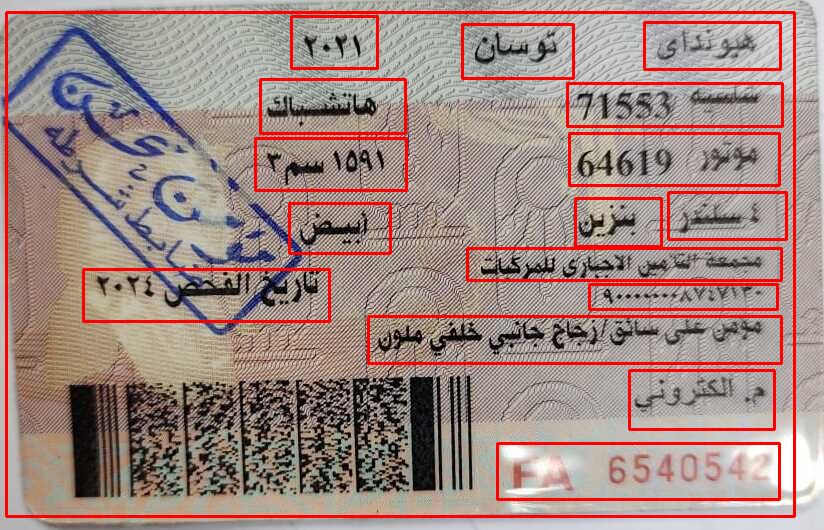

In [ ]:
img_path='/content/arabic_cards/eg1.jpeg'
df_img= multi_df.loc[multi_df['id']=='eg1.jpeg77447']
# display(df_img)
img = cv2.imread(img_path)
for index, row in df_img.iterrows():
    # print(row['x1_x'], row['y1_x'],row['x2_x'], row['y2_x'])
    cv2.rectangle(img,(row['x1_x'],row['y1_x']),(row['x2_x'],row['y2_x']),(0,0,255),2)
    # cv2.rectangle(image, start_point, end_point, color, thickness)
cv2_imshow(img)
# for i in df_img.to_dict():
#   print(i)
  # cv2.rectangle(img,df_img['x1_x'][i],df_img['x1_y'][i],df_img['x2_x'][i],df_img['x2_y'][i])

# cv2_imshow(img)  

In [ ]:
X_train = multi_df[['transformed_x1','transformed_y1','transformed_x2','transformed_y2']].astype(float)
Y_train = multi_df['label_x']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_train, Y_train, train_size=0.7, test_size=0.3, random_state=45)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
47/47 [==============================] - 1s 6ms/step - loss: 2.8291 - accuracy: 0.0957 - val_loss: 2.7864 - val_accuracy: 0.1667
Epoch 2/100
47/47 [==============================] - 0s 2ms/step - loss: 2.7930 - accuracy: 0.1277 - val_loss: 2.7668 - val_accuracy: 0.1250
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 2.7556 - accuracy: 0.1809 - val_loss: 2.7161 - val_accuracy: 0.2500
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 2.6992 - accuracy: 0.1702 - val_loss: 2.6527 - val_accuracy: 0.2500
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 2.6192 - accuracy: 0.1809 - val_loss: 2.5829 - val_accuracy: 0.2500
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 2.5365 - accuracy: 0.2021 - val_loss: 2.5050 - val_accuracy: 0.2500
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 2.4530 - accuracy: 0.1915 - val_loss: 2.4271 - val_accuracy: 0.2500
Epoch 8/100
4

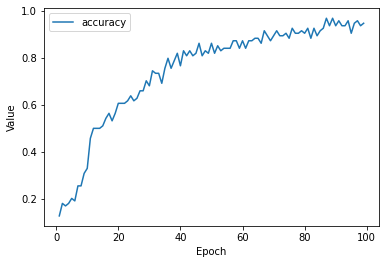

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.003
epochs = 100
batch_size = 2
validation_split = 0.2

# Establish the model's topography.
my_model = create_model(learning_rate)

# Train the model on the normalized training set.
epochs, hist = train_model(my_model, X_train, y_train, 
                           epochs, batch_size, validation_split)

# Plot a graph of the metric vs. epochs.
list_of_metrics_to_plot = ['accuracy']
plot_curve(epochs, hist, list_of_metrics_to_plot)

# Evaluate against the test set.
print("\n Evaluate the new model against the test set:")
my_model.evaluate(x=X_test, y=y_test, batch_size=batch_size)
my_model.save('model_final.h5')

In [ ]:
from keras.models import load_model
from numpy import loadtxt

In [ ]:
model=load_model('model_final.h5') 
#dataset=loadtxt('coordinates.csv')

In [ ]:
def get_max_index(list_arr):
  list_arr = list(list_arr)
  max_value = max(list_arr)
  max_index = list_arr.index(max_value)
  return max_index

In [ ]:
multi_df[:100]

,label_x,x1_x,y1_x,x2_x,y2_x,id,label_y,x1_y,y1_y,x2_y,y2_y,transformed_x1,transformed_y1,transformed_x2,transformed_y2,label_1
0,0,666,42,771,88,c.jpg46967,17,26,4,776,481,0.146667,0.920335,0.006667,0.823899,1
1,1,532,46,576,89,c.jpg46967,17,26,4,776,481,0.325333,0.911950,0.266667,0.821803,0
2,2,311,23,389,71,c.jpg46967,17,26,4,776,481,0.620000,0.960168,0.516000,0.859539,0
3,3,530,103,772,153,c.jpg46967,17,26,4,776,481,0.328000,0.792453,0.005333,0.687631,0
4,4,281,82,402,132,c.jpg46967,17,26,4,776,481,0.660000,0.836478,0.498667,0.731656,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,10,548,285,891,335,img4.png689462,17,23,6,907,550,0.406109,0.487132,0.018100,0.395221,0
96,11,673,330,874,366,img4.png689462,17,23,6,907,550,0.264706,0.404412,0.037330,0.338235,0
97,12,96,257,380,339,img4.png689462,17,23,6,907,550,0.917421,0.538603,0.596154,0.387868,0
98,13,558,362,886,433,img4.png689462,17,23,6,907,550,0.394796,0.345588,0.023756,0.215074,0


In [ ]:
get_max_index(my_model.predict([[0.660000,0.836478,0.498667,0.731656],[0.199813,0.886997,0.054155,0.820433]])[0])

4

In [ ]:
get_max_index(my_model.predict([[0.1975860297679901, 0.10986033082008362, 0.18090219795703888, 0.0937931165099144]])[0])

15

In [ ]:
import pandas as pd
df=pd.read_csv('coordinates.csv')

In [ ]:
import ast


In [ ]:
df['Geometry'][0]

'(0.4630727171897888, 0.040359824895858765, 0.44582971930503845, 0.02311680279672146)'

In [ ]:
df['Feilds']=''

In [ ]:
for i in range(len(df)):
  output=get_max_index(my_model.predict([ast.literal_eval(df['Geometry'][i])])[0])
  print(output)
  df['Feilds'][i]= output

In [ ]:
df.loc[df['Type']=='LINE']

,DetectedText,Type,Id,Confidence,Geometry,ParentId,Feilds
0,1,LINE,0,89.837418,"(0.4630727171897888, 0.040359824895858765, 0.4...",0.0,12
1,-,LINE,1,25.010612,"(0.17776045203208923, 0.05078125, 0.1683385223...",0.0,15
2,was,LINE,2,7.661883,"(0.4309006929397583, 0.0475422628223896, 0.414...",0.0,12
3,...,LINE,3,11.471370,"(0.4165845513343811, 0.056865058839321136, 0.4...",0.0,12
4,مفر,LINE,4,19.245218,"(0.3373051583766937, 0.5146484375, 0.228010758...",0.0,8
5,-,LINE,5,88.174370,"(0.17502400279045105, 0.09092064201831818, 0.1...",0.0,14
6,out,LINE,6,17.833437,"(0.19034269452095032, 0.08979956060647964, 0.1...",0.0,15
7,and,LINE,7,15.555707,"(0.21151651442050934, 0.10320635139942169, 0.1...",0.0,15
8,جنة,LINE,8,7.791596,"(0.1975860297679901, 0.10986033082008362, 0.18...",0.0,14
9,حمد,LINE,9,7.233195,"(0.23198051750659943, 0.10945430397987366, 0.2...",0.0,15


In [ ]:
width= 0.22427880764007568
Height= 0.07634018361568451
x_min= 0.6966999173164368
y_min= 0.26072919368743896
x_max=0.6966999173164368+0.22427880764007568
y_max=0.26072919368743896+0.07634018361568451

In [ ]:
get_max_index(my_model.predict([[x_max-0.2,y_max+0.4,x_min-0.2,y_min+0.4]])[0])

6

In [ ]:
get_max_index(my_model.predict([[0.9234446883201599-0.2, 0.2293851375579834+0.4, 0.6965235471725464-0.2, 0.15013037621974945+0.4]])[0])

9